In [1]:
import sys
import optuna
import numpy as np
import pandas as pd
from itertools import combinations

sys.path.append("..")
from feature_engineering import time_based_train_test_split, get_return, round_to_step, get_mask
from etl_pipeline_local import get_btts_table, get_match_data

pd.set_option('display.max_columns', None)
target_col = "btts"
odds_col: str = "goalNoGoal_quote_currentGG"

In [2]:
# TODO: far scegliere a Optuna se tenere o meno una variabile
# TODO: aggiungere early stopping
# TODO: perfezionare funzione di costo per tradeoff roi medio e quantità di partite considerate
# TODO: logging risultati
# TODO: analisi  univariata KPI più promettenti (Optional)

In [3]:
# Load data
df_loaded = get_btts_table()

df_loaded = df_loaded.sort_values('time').reset_index(drop=True)

# Train/test split
df = df_loaded.copy()
df["return"] = df.apply(lambda x: get_return(strategy=x[target_col], odds=x["goalNoGoal_quote_currentGG"]), axis=1).copy()

# Adding week column 
df["week"] = df["time"].dt.to_period("W")
monday_start = df["time"].min() - pd.to_timedelta(df["time"].min().weekday(), unit="D")
df["week"] = ((df["time"] - monday_start).dt.days // 7) + 1


df_train, df_test = time_based_train_test_split(df=df, time_col="time", train_frac=0.8)

In [4]:
# Define features and relative step
feature_bins_map = {
    'goalNoGoal_chance_goalHome': 2.5,
    'goalNoGoal_chance_goalAway': 2.5, 
    'goalNoGoal_comparison_affini': 2000,
    'underOver_chance_over15HT': 5,
    'underOver_comparison_affini': 2000,
    'evaluation_valScala': None,
    'evaluation_valMetrica': None,
 }

 
# Create the binned dataframe
df_train_binned = df_train.copy()

    
for feat, step in feature_bins_map.items():
    df_train_binned[feat] = [round_to_step(x, step) for x in df_train_binned[feat]]

    if isinstance(step, int):
        df_train_binned[feat] = df_train_binned[feat].astype("Int64")

print("SEARCH SPACE\n")
for feat in feature_bins_map.keys():
    space = df_train_binned[feat].sort_values(ascending=True).unique()
    print(f"Feature: {feat}")
    print(f"Search space: {space}")
    print("\n")

SEARCH SPACE

Feature: goalNoGoal_chance_goalHome
Search space: [  0.   15.   17.5  20.   22.5  25.   27.5  30.   32.5  35.   37.5  40.
  42.5  45.   47.5  50.   52.5  55.   57.5  60.   62.5  65.   67.5  70.
  72.5  75.   77.5  80.   82.5  85.   87.5  90.   92.5  95.   97.5 100. ]


Feature: goalNoGoal_chance_goalAway
Search space: [  0.   12.5  15.   20.   22.5  25.   27.5  30.   32.5  35.   37.5  40.
  42.5  45.   47.5  50.   52.5  55.   57.5  60.   62.5  65.   67.5  70.
  72.5  75.   77.5  80.   82.5  85.   87.5  90.   92.5  95.   97.5 100. ]


Feature: goalNoGoal_comparison_affini
Search space: <IntegerArray>
[0, 2000, 4000, 6000, 8000, 10000, 12000, 14000, 16000, 18000, 20000, 22000]
Length: 12, dtype: Int64


Feature: underOver_chance_over15HT
Search space: <IntegerArray>
[15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70]
Length: 12, dtype: Int64


Feature: underOver_comparison_affini
Search space: <IntegerArray>
[0, 2000, 4000, 6000, 8000, 10000, 12000, 16000, 18000]
Length: 9, dt

In [5]:
import numpy as np
import pandas as pd
import optuna
from itertools import combinations

min_obs = 100

def build_categorical_choices(non_null_series):
    unique_vals = sorted(map(str, non_null_series.unique()))
    categorical_set = [
        list(c)
        for r in range(1, len(unique_vals) + 1)
        for c in combinations(unique_vals, r)
    ]
    return categorical_set


def build_numeric_configs(values):
    values = sorted(values)
    configs = []

    # solo lower bound
    for v in values[:-1]:
        configs.append({
            "use_min": True,
            "use_max": False,
            "min": v,
            "max": None,
        })

    # solo upper bound
    for v in values[1:]:
        configs.append({
            "use_min": False,
            "use_max": True,
            "min": None,
            "max": v,
        })

    # lower + upper bound
    for i, lo in enumerate(values[:-1]):
        for hi in values[i + 1:]:
            configs.append({
                "use_min": True,
                "use_max": True,
                "min": lo,
                "max": hi,
            })

    return configs


def objective(trial):
    mask = pd.Series(True, index=df_train_binned.index)

    for feat, step in feature_bins_map.items():
        s = df_train_binned[feat]
        non_null = s.dropna()

        if non_null.empty:
            continue

        feat_mask = pd.Series(True, index=s.index)

        # =========================
        # CASO 1: feature categorica
        # =========================
        if not step:
            categorical_set = build_categorical_choices(non_null)

            cat_idx = trial.suggest_categorical(
                f"{feat}_cat_idx",
                list(range(len(categorical_set)))
            )

            categorical_feat = categorical_set[cat_idx]
            trial.set_user_attr(f"{feat}_cat", categorical_feat)

            # confronto coerente anche se ci sono stringhe / <NA>
            feat_mask &= s.astype(str).isin(categorical_feat)

        # =========================
        # CASO 2: feature numerica
        # =========================
        else:
            # uso valori discreti già presenti nei dati
            values = sorted(non_null.unique().tolist())

            # servono almeno 2 valori distinti per costruire un range sensato
            if len(values) < 2:
                continue

            numeric_configs = build_numeric_configs(values)

            cfg_idx = trial.suggest_categorical(
                f"{feat}_cfg_idx",
                list(range(len(numeric_configs)))
            )

            cfg = numeric_configs[cfg_idx]
            use_min = cfg["use_min"]
            use_max = cfg["use_max"]
            feat_min = cfg["min"]
            feat_max = cfg["max"]

            trial.set_user_attr(f"{feat}_cfg", cfg)

            # sempre stessa distribuzione per la feature
            include_missing = False
            if s.isna().sum() > 0:
                include_missing = trial.suggest_categorical(
                    f"{feat}_include_missing",
                    [True, False]
                )
                trial.set_user_attr(f"{feat}_include_missing", include_missing)

            # applicazione filtro numerico
            if use_min:
                feat_mask &= s >= feat_min

            if use_max:
                feat_mask &= s <= feat_max

            if s.isna().sum() > 0:
                if include_missing:
                    feat_mask = feat_mask | s.isna()
                else:
                    feat_mask = feat_mask & s.notna()

        mask &= feat_mask

    selected = df_train_binned.loc[mask]

    if len(selected) <= 0:
        return -1e9

    if len(selected) < min_obs:
        return -1e9

    mean_return = selected["return"].mean()
    mean_weekly_return = selected.groupby("week")["return"].sum().mean()
    std_weekly_return = selected.groupby("week")["return"].sum().std(ddof=0)
    mean_weekly_counts = selected.groupby("week")["return"].count().mean()
    std_weekly_counts = selected.groupby("week")["return"].count().std(ddof=0)

    score = mean_weekly_return - 0.5 * std_weekly_return

    return float(score)

In [6]:
def run_one_study(seed, n_trials):
    study = optuna.create_study(direction="maximize")
 
    sampler = optuna.samplers.TPESampler(
        seed=seed,
        multivariate=True,
        group=True,
        n_startup_trials=80, # 10 - 30 per search space semplici, 50 100+ per seearch space con molti minimi
        n_ei_candidates=64, # 24 default, problemi difficili: 64 o 128
    )
    study = optuna.create_study(direction="maximize", sampler=sampler)
    study.optimize(objective, n_trials=n_trials, n_jobs=1)
    return study

studies = [run_one_study(seed=s, n_trials=500) for s in range(10)]

all_trials = []
for study in studies:
    all_trials.extend(
        [t for t in study.trials if t.value is not None and t.state.name == "COMPLETE"]
    )

top_trials = sorted(all_trials, key=lambda t: -t.value)[20:]

[I 2026-03-31 16:13:09,197] A new study created in memory with name: no-name-ab0ab62e-baff-4cb4-ae4b-707ad935aa6c
/tmp/ipykernel_36110/2639057361.py:4: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  sampler = optuna.samplers.TPESampler(
/tmp/ipykernel_36110/2639057361.py:4: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  sampler = optuna.samplers.TPESampler(
[I 2026-03-31 16:13:09,199] A new study created in memory with name: no-name-b9bfe3e9-625d-4efd-8a58-e0eb96ab3399
[I 2026-03-31 16:13:09,212] Trial 0 finished with value: -1000000000.0 and parameters: {'goalNoGoal_chance_goalHome_cfg_idx': 619, 'goalNoGoal_chance_goalAway_cfg_idx': 274, 'goalNoGoal_comparison_affini_cfg_idx': 27, 'underOver_chance_over15HT_cfg_idx': 63, 'underOver_comparison_affini_cfg_idx': 12, 'evaluation_valScala_cat_idx': 17, 'evaluation_valMetrica_cat_idx': 298}. Best is trial 0 w

In [7]:
top_trials

[FrozenTrial(number=352, state=<TrialState.COMPLETE: 1>, values=[-0.4472683333205908], datetime_start=datetime.datetime(2026, 3, 31, 16, 13, 28, 768087), datetime_complete=datetime.datetime(2026, 3, 31, 16, 13, 28, 783535), params={'goalNoGoal_chance_goalHome_cfg_idx': 597, 'goalNoGoal_chance_goalAway_cfg_idx': 576, 'goalNoGoal_comparison_affini_cfg_idx': 65, 'underOver_chance_over15HT_cfg_idx': 70, 'underOver_comparison_affini_cfg_idx': 31, 'evaluation_valScala_cat_idx': 11, 'evaluation_valMetrica_cat_idx': 352}, user_attrs={'goalNoGoal_chance_goalHome_cfg': {'use_min': True, 'use_max': True, 'min': 65.0, 'max': 72.5}, 'goalNoGoal_chance_goalAway_cfg': {'use_min': True, 'use_max': True, 'min': 60.0, 'max': 92.5}, 'goalNoGoal_comparison_affini_cfg': {'use_min': True, 'use_max': True, 'min': 8000, 'max': 20000}, 'underOver_chance_over15HT_cfg': {'use_min': True, 'use_max': True, 'min': 40, 'max': 60}, 'underOver_comparison_affini_cfg': {'use_min': True, 'use_max': True, 'min': 4000, 'ma

In [8]:
# Create the test binned dataframe
df_test_binned = df_test.copy()

for feat, step in feature_bins_map.items():
    df_test_binned[feat] = [round_to_step(x, step) for x in df_test_binned[feat]]

    if isinstance(step, int):
        df_test_binned[feat] = df_test_binned[feat].astype("Int64")

# Get the resulting dataframes
# params_dict = study.best_trial.user_attrs
params_dict = top_trials[0].user_attrs

train_mask = get_mask(df_train_binned, params_dict)
test_mask = get_mask(df_test_binned, params_dict)

df_train_filtered = df_train_binned[train_mask]
df_test_filtered = df_test_binned[test_mask]

In [9]:
mean_roi = df_train_filtered["return"].mean()
right = df_train_filtered[target_col].sum()  
total = df_train_filtered.shape[0]

accuracy = np.round((right / total), 1)
print(f"Mean ROI: {mean_roi}")
print(f"Accuracy: {accuracy} ({right}/{total})")

Mean ROI: -0.016689258574655978
Accuracy: 0.6 (2746/4869)


In [10]:
mean_roi = df_test_filtered["return"].mean()
right = df_test_filtered[target_col].sum()  
total = df_test_filtered.shape[0]

accuracy = np.round((right / total), 1)
print(f"Mean ROI: {mean_roi}")
print(f"Accuracy: {accuracy} ({right}/{total})")

Mean ROI: -0.0332162661737523
Accuracy: 0.5 (586/1082)


# Plots

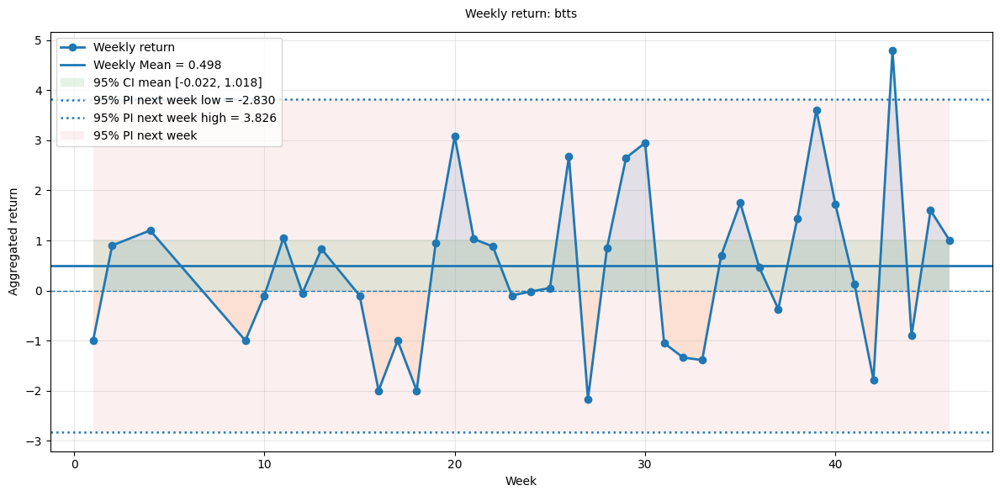

In [156]:
sys.path.append("../..")
from strategies.utils import analyze_strategies, get_best_strategies

df_tot_filtered = pd.concat([df_train_filtered, df_test_filtered], axis=0).reset_index(drop=True).rename(columns={target_col: "result", "time": "date"})
df_tot_filtered = df_tot_filtered.sort_values(by="date", ascending=False)
 
df_tot_filtered["strategy"] = target_col

weekly_return, stats = analyze_strategies(df_tot_filtered, strategies=[target_col], print_pi=True)

In [157]:
weeks = stats["n_weeks"]
total_weeks = max(df["weeks"])

print(f"No. of weeks covered: {weeks}/{total_weeks} ({np.round((weeks/total_weeks), 2)})")

No. of weeks covered: 40/47 (0.85)


In [127]:
get_best_strategies(df_tot_filtered)

,weekly_mean_return,weekly_std_return,weekly_counts,weekly_std_counts,total_counts,accuracy
btts,0.64,1.85,5.23,3.42,246,0.57


In [50]:
def dict_to_range_text(d):
    grouped = {}

    for key, value in d.items():
        if key.endswith('_use_min'):
            base = key[:-8]
            grouped.setdefault(base, {})['use_min'] = value
        elif key.endswith('_use_max'):
            base = key[:-8]
            grouped.setdefault(base, {})['use_max'] = value
        elif key.endswith('_min'):
            base = key[:-4]
            grouped.setdefault(base, {})['min'] = value
        elif key.endswith('_max'):
            base = key[:-4]
            grouped.setdefault(base, {})['max'] = value
        elif key.endswith('_cat'):
            base = key[:-4]
            grouped.setdefault(base, {})['cat'] = value

    lines = []

    for base, vals in grouped.items():
        if 'cat' in vals:
            cats = [x for x in vals['cat'] if x != '<NA>']
            lines.append(f"{base}: categorie ammesse = {', '.join(map(str, cats))}")
            continue

        use_min = vals.get('use_min', False)
        use_max = vals.get('use_max', False)
        min_val = vals.get('min')
        max_val = vals.get('max')

        if use_min and use_max:
            lines.append(f"{base}: tra {min_val} e {max_val}")
        elif use_min:
            lines.append(f"{base}: >= {min_val}")
        elif use_max:
            lines.append(f"{base}: <= {max_val}")
        else:
            lines.append(f"{base}: nessun vincolo")

    return "\n".join(lines)

text = dict_to_range_text(params_dict)
print(text)

goalNoGoal_chance_goalHome: tra 77.5 e 85.0
goalNoGoal_chance_goalAway: <= 62.5
goalNoGoal_comparison_affini: >= 16000
underOver_chance_over15HT: <= 70
underOver_comparison_affini: <= 16000
evaluation_valScala: categorie ammesse = 49657, 48727, 50827
evaluation_valMetrica: categorie ammesse = 398418, 354214, 225586, 494608
